<a href="https://colab.research.google.com/github/PaulToronto/Applied-Geospatial-Data-Science-with-Python---Book/blob/main/2_1_Introduction_to_Contextily.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction to Contextily

## Imports

In [2]:
!pip install contextily

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 61.6 MB/s eta 0:00:00


In [107]:
import matplotlib.pyplot as plt
import geopandas as gpd

import rasterio as rio
from rasterio.plot import show as rioshow

import contextily as cx

In [103]:
from google.colab import drive

drive.mount('/content/gdrive')

drive_path = '/content/gdrive/MyDrive/Colab Notebooks/Data Science/Applied Geospatial Data Science with Python - Book/data/'

Mounted at /content/gdrive


## Delineation of urban areas in Spain

In [4]:
data_url = 'https://ndownloader.figshare.com/files/20232174'

In [5]:
spain = gpd.read_file(data_url)
spain.shape

(717, 3)

In [6]:
spain.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 717 entries, 0 to 716
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   city_id      717 non-null    object  
 1   n_buildings  717 non-null    int64   
 2   geometry     717 non-null    geometry
dtypes: geometry(1), int64(1), object(1)
memory usage: 16.9+ KB


In [7]:
spain.head(1)

,city_id,n_buildings,geometry
0,ci000,2348,"POLYGON ((385390.071 4202949.446, 384488.697 4..."


In [9]:
spain.crs

<Projected CRS: EPSG:25830>
Name: ETRS89 / UTM zone 30N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe between 6°W and 0°W: Faroe Islands offshore; Ireland - offshore; Jan Mayen - offshore; Norway including Svalbard - offshore; Spain - onshore and offshore.
- bounds: (-6.0, 35.26, 0.01, 80.49)
Coordinate Operation:
- name: UTM zone 30N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989 ensemble
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

- the simplest way to access `contextily` and get a background map to go with your geographic data is to use the `add_basemap` method

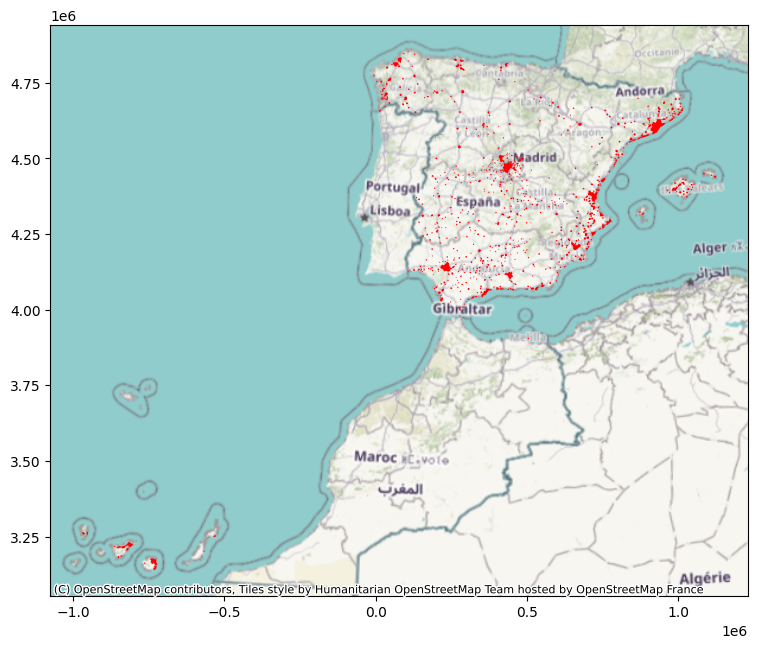

In [11]:
ax = spain.plot(color='red', figsize=(9, 9))
cx.add_basemap(ax, crs=spain.crs)

## Providers

- there are a lot of providers to choose from so you can easily switch between backgrounds

In [17]:
zaragoza = spain.query("city_id == 'ci122'")
zaragoza

,city_id,n_buildings,geometry
112,ci122,23604,"POLYGON ((672442.171 4608117.375, 672413.234 4..."


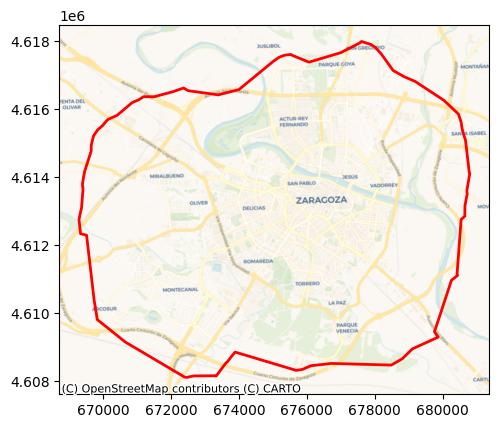

In [22]:
ax = zaragoza.plot(facecolor='none',
                   edgecolor='red',
                   linewidth=2)

cx.add_basemap(ax,
               crs=zaragoza.crs,
               source=cx.providers.CartoDB.Voyager)

- the source of these provider tiles is `xyzservices`: https://xyzservices.readthedocs.io/en/stable/
- they come as `xyzservices.Bunch` objects with make them easy to explore with Python
- you can pass predefined tile providers from the `contextily.providers` module or any other `xyzservices.TileProvider`
- the docs: https://xyzservices.readthedocs.io/en/stable/index.html

In [23]:
cx.providers

{'OpenStreetMap': {'Mapnik': {'url': 'https://tile.openstreetmap.org/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.Mapnik'},
  'DE': {'url': 'https://tile.openstreetmap.de/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.DE'},
  'CH': {'url': 'https://tile.osm.ch/switzerland/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'bounds': [[45, 5], [48, 11]],
   'name': 'OpenStreetMap.CH'},
  'France': {'url': 'https://{s}.tile.openstreetmap.fr/osmfr/{z}/{x}/{y}.png',
   'max_zoom': 20,
   'html_attribution': '&copy; OpenStreetMap France | &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap France | (C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.France'},
  'HOT': {'url': 'https://{s}.tile.openstreetmap.fr/hot/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles style by <a href="https://www.hotosm.org/" target="_blank">Humanitarian OpenStreetMap Team</a> hosted by <a href="https://openstreetmap.fr/" target="_blank">OpenStreetMap France</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles style by Humanitarian OpenStreetMap Team hosted by OpenStreetMap France',
   'name': 'OpenStreetMap.HOT'},
  'BZH': {'url': 'https://tile.openstreetmap.bzh/br/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="http://www.openstreetmap.bzh/" target="_blank">Breton OpenStreetMap Team</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
   'bounds': [[46.2, -5.5], [50, 0.7]],
   'name': 'OpenStreetMap.BZH'},
  'BlackAndWhite': {'url': 'http://{s}.tiles.wmflabs.org/bw-mapnik/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'attribution': '(C) OpenStreetMap contributors',
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'name': 'OpenStreetMap.BlackAndWhite'}},
 'MapTilesAPI': {'OSMEnglish': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'en/map/v1',
   'apikey': '<insert your api key here>',
   'max_zoom': 19,
   'name': 'MapTilesAPI.OSMEnglish'},
  'OSMFrancais': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'fr/map/v1',
   'apikey': '<insert your api key here>',
   'max_zoom': 19,
   'name': 'MapTilesAPI.OSMFrancais'},
  'OSMEspagnol': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'es/map/v1',
   'apikey': '<insert 

In [24]:
cx.providers.OpenStreetMap

{'Mapnik': {'url': 'https://tile.openstreetmap.org/{z}/{x}/{y}.png',
  'max_zoom': 19,
  'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
  'attribution': '(C) OpenStreetMap contributors',
  'name': 'OpenStreetMap.Mapnik'},
 'DE': {'url': 'https://tile.openstreetmap.de/{z}/{x}/{y}.png',
  'max_zoom': 18,
  'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
  'attribution': '(C) OpenStreetMap contributors',
  'name': 'OpenStreetMap.DE'},
 'CH': {'url': 'https://tile.osm.ch/switzerland/{z}/{x}/{y}.png',
  'max_zoom': 18,
  'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
  'attribution': '(C) OpenStreetMap contributors',
  'bounds': [[45, 5], [48, 11]],
  'name': 'OpenStreetMap.CH'},
 'France': {'url': 'https://{s}.tile.openstreetmap.fr/osmfr/{z}/{x}/{y}.png',
  'max_zoom': 20,
  'html_attribution': '&copy; OpenStreetMap France | &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
  'attribution': '(C) OpenStreetMap France | (C) OpenStreetMap contributors',
  'name': 'OpenStreetMap.France'},
 'HOT': {'url': 'https://{s}.tile.openstreetmap.fr/hot/{z}/{x}/{y}.png',
  'max_zoom': 19,
  'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles style by <a href="https://www.hotosm.org/" target="_blank">Humanitarian OpenStreetMap Team</a> hosted by <a href="https://openstreetmap.fr/" target="_blank">OpenStreetMap France</a>',
  'attribution': '(C) OpenStreetMap contributors, Tiles style by Humanitarian OpenStreetMap Team hosted by OpenStreetMap France',
  'name': 'OpenStreetMap.HOT'},
 'BZH': {'url': 'https://tile.openstreetmap.bzh/br/{z}/{x}/{y}.png',
  'max_zoom': 19,
  'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="http://www.openstreetmap.bzh/" target="_blank">Breton OpenStreetMap Team</a>',
  'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
  'bounds': [[46.2, -5.5], [50, 0.7]],
  'name': 'OpenStreetMap.BZH'},
 'BlackAndWhite': {'url': 'http://{s}.tiles.wmflabs.org/bw-mapnik/{z}/{x}/{y}.png',
  'max_zoom': 18,
  'attribution': '(C) OpenStreetMap contributors',
  'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
  'name': 'OpenStreetMap.BlackAndWhite'}}

## Coordinate-based searches

- here you need a bounding box of coordinates to access tiles
- this bounding box needs to be expressed either in Web (Spherical) Mercator or longitude and latitude (WGS84)
    - that is what gets returned as the second value by `cx.bounds2img`

### Toronto Example

In [51]:
toronto = cx.Place('Toronto', zoom=10)
toronto.bbox_map

(-8883817.175416324, -8805545.658452304, 5361598.9120354, 5479006.187481432)

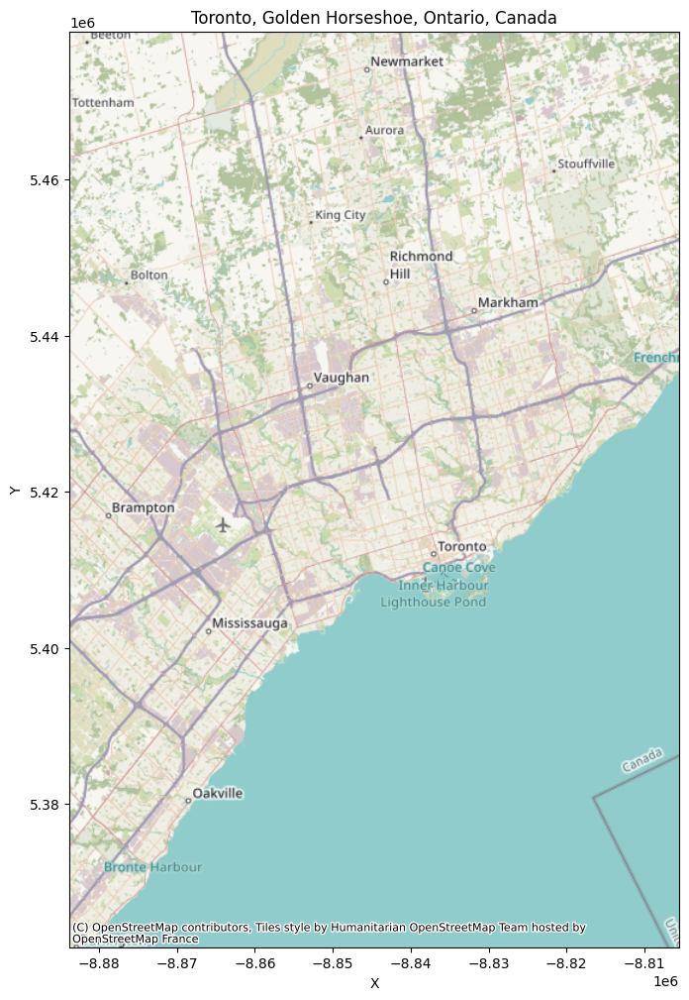

In [52]:
ax = toronto.plot()
ax.axis('on');

In [49]:
cx.bounds2img

<function contextily.tile.bounds2img(w, s, e, n, zoom='auto', source=None, ll=False, wait=0, max_retries=2, n_connections=1, use_cache=True, zoom_adjust=None)>

In [84]:
trnto_img, trnto_ext = cx.bounds2img(#toronto.w,
                                     #toronto.s,
                                     #toronto.e,
                                     #toronto.n,
                                     *toronto.bbox,
                                     ll=True,
                                     source=cx.providers.CartoDB.Voyager)

type(trnto_img), type(trnto_ext)

(numpy.ndarray, tuple)

In [85]:
trnto_img.shape # 3-dimensional array with the image colors

(1024, 1024, 4)

In [86]:
trnto_ext, toronto.bbox_map

((-8883817.175416324,
  -8805545.658452304,
  5381166.791276407,
  5459438.308240427),
 (-8883817.175416324, -8805545.658452304, 5361598.9120354, 5479006.187481432))

In [87]:
# not that I fed cx.bounds2img the numbers for toronto.bbox
# but it returned trnto_ext which is toronto.bbox_map
toronto.w, toronto.s, toronto.e, toronto.n, toronto.bbox

(-79.6392832,
 43.5796082,
 -79.1132193,
 43.8554425,
 [-79.6392832, 43.5796082, -79.1132193, 43.8554425])

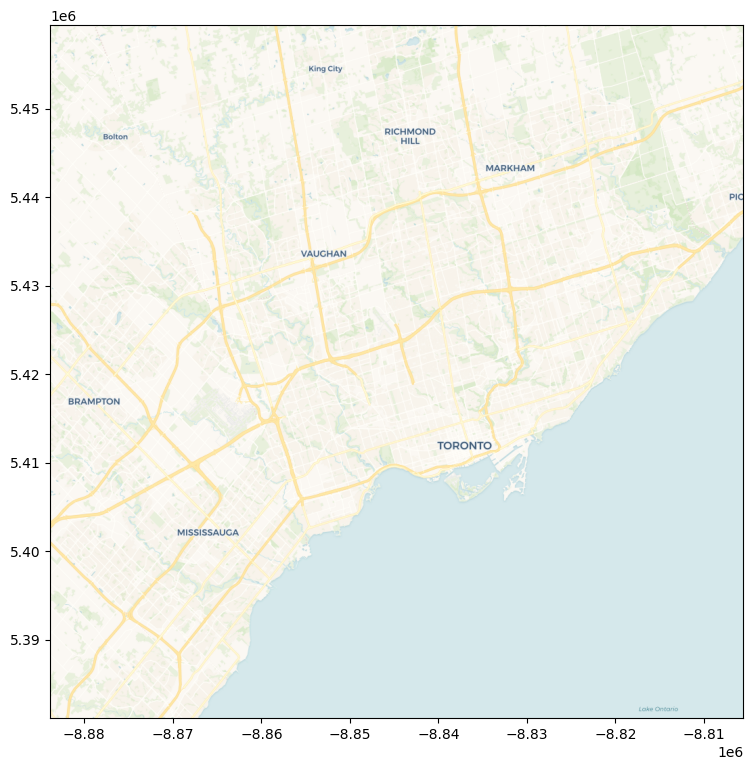

In [88]:
f, ax = plt.subplots(1, figsize=(9, 9))
ax.imshow(trnto_img, extent=trnto_ext);

### Ghent (Belgium) Example

In [89]:
# bounding box for Ghent
west, south, east, north = (
    3.616218566894531,
    50.98912458110244,
    3.8483047485351562,
    51.13994019806845
    )

In [90]:
ghent_img, ghent_ext = cx.bounds2img(
    west,
    south,
    east,
    north,
    ll=True,
    source=cx.providers.CartoDB.Voyager
)

In [91]:
ghent_ext

(401141.5244406049, 430493.34330211265, 6613943.183459732, 6653078.941941739)

In [92]:
ghent_img.shape

(1024, 768, 4)

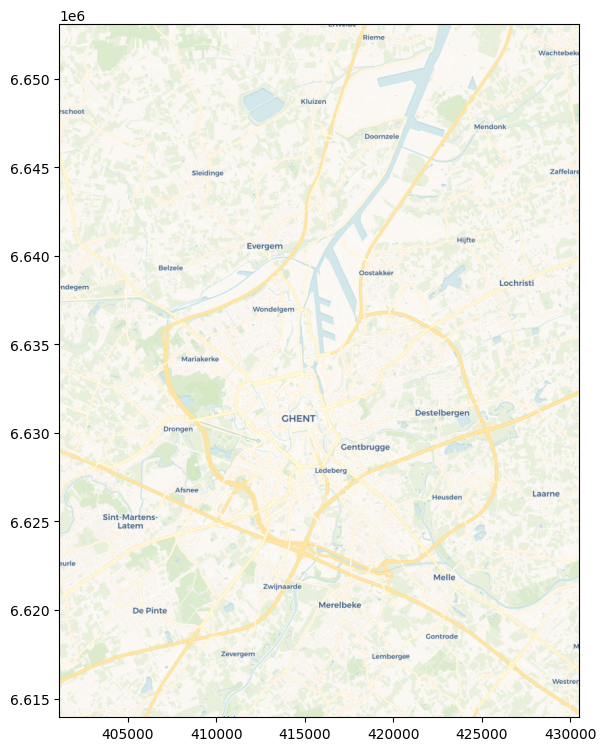

In [94]:
f, ax = plt.subplots(1, figsize=(9, 9))
ax.imshow(ghent_img, extent=ghent_ext);

## Places: `contextily.Place`

In [95]:
nightlights = cx.providers.NASAGIBS.ViirsEarthAtNight2012
ireland = cx.Place('Ireland', source=nightlights)

In [96]:
ireland

Place : Éire / Ireland | n_tiles: 1 | zoom : 8 | im : (1536, 1024)

In [97]:
type(ireland)

contextily.place.Place

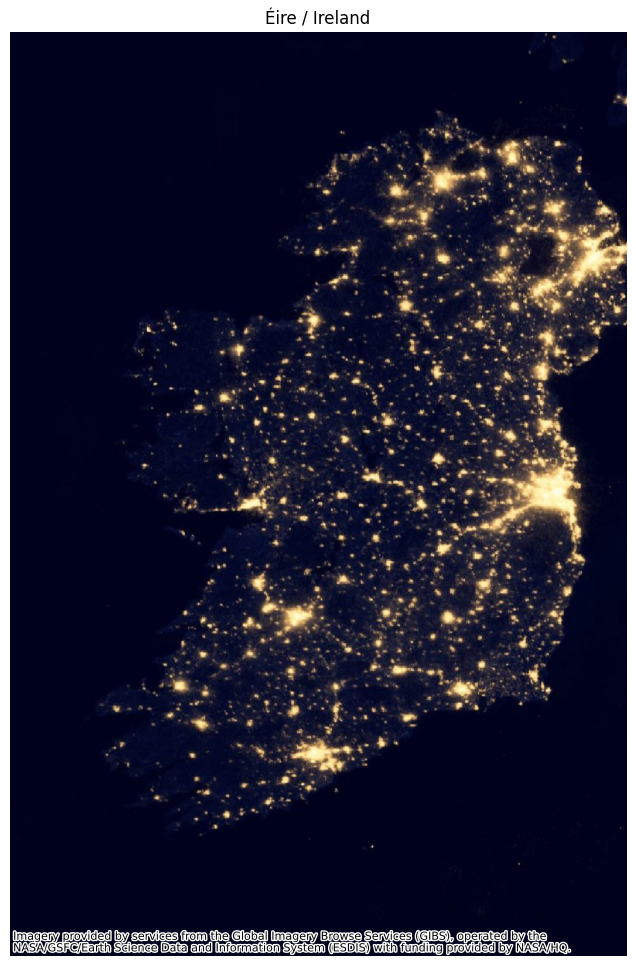

In [99]:
ireland.plot();

## Store basemaps locally

- In a given session, each tile is only downloaded once and stored in a temporary cache

In [100]:
%time tempe = cx.Place('Tempe, AZ')

CPU times: user 1.72 s, sys: 47.6 ms, total: 1.77 s
Wall time: 21.1 s


In [101]:
%time tempe = cx.Place('Tempe, AZ')

CPU times: user 85.7 ms, sys: 6.89 ms, total: 92.6 ms
Wall time: 909 ms


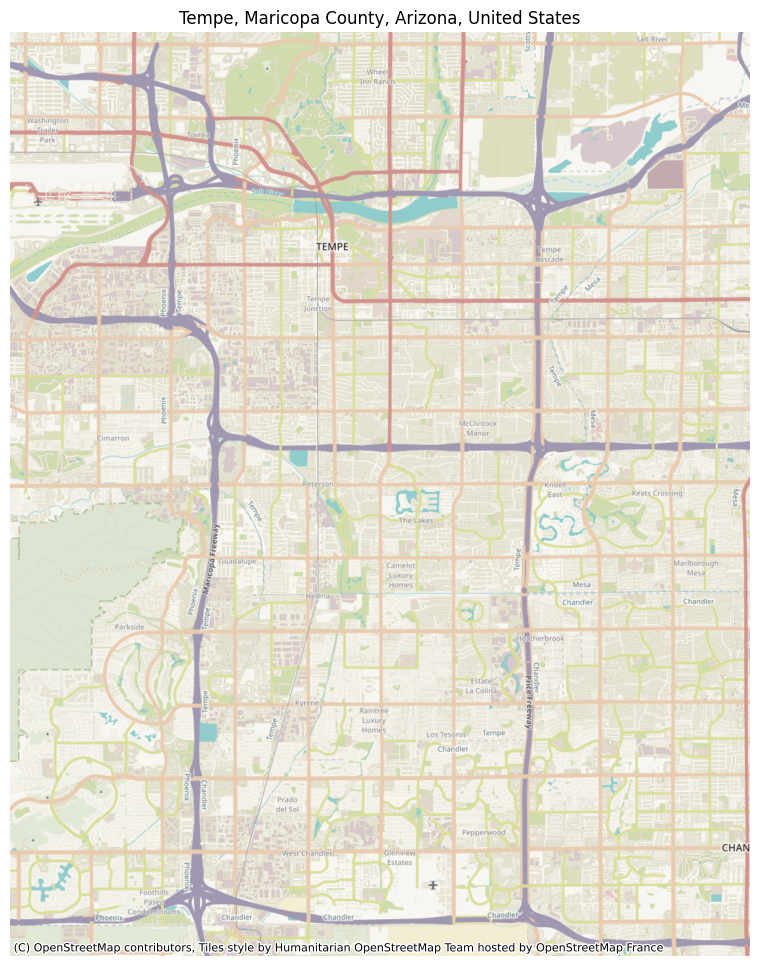

In [102]:
tempe.plot();

- `contextily` lets you download basemaps and store them in standard raster files, that you can open in Python or any other GIS
- there are a number of ways to save these files, one way is through the Places aPI (using path)

In [105]:
bristol = cx.Place('Bristol, UK', path=drive_path + 'bristol.tif')

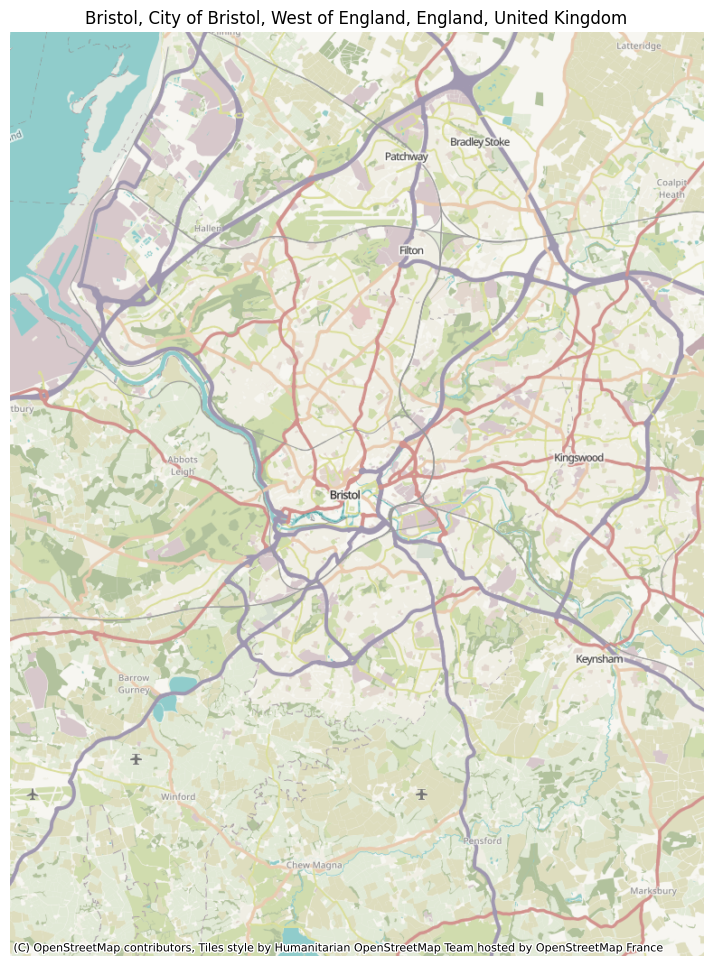

In [106]:
# you can still use it this way
bristol.plot();

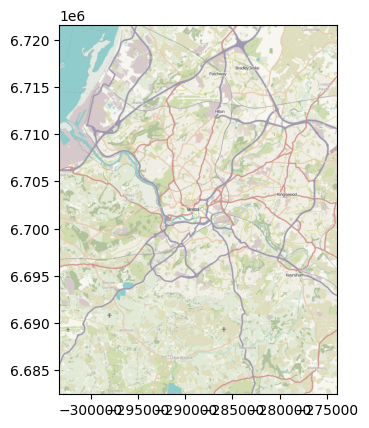

In [108]:
# or you can retrieve it from the file
with rio.open(drive_path + 'bristol.tif') as r:
    rioshow(r)

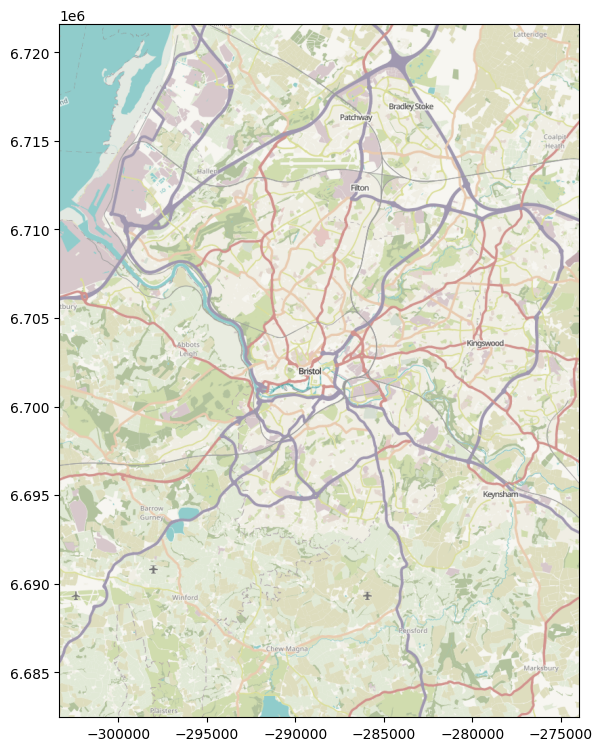

In [110]:
f, ax = plt.subplots(1, figsize=(9, 9))

with rio.open(drive_path + 'bristol.tif') as r:
    rioshow(r, ax=ax)

- another way to display this image is to use `cx.bounds2img`'s siter method: `cx.bounds2raster`

In [114]:
_ = cx.bounds2raster(*bristol.bbox,
                     ll=True,
                     path=drive_path + 'bristol2.tif',
                     source=cx.providers.CartoDB.Positron)

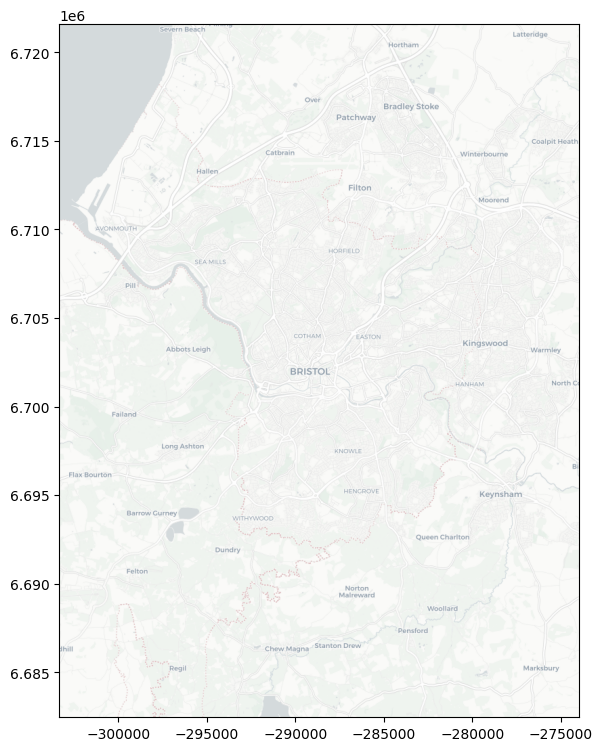

In [117]:
f, ax = plt.subplots(1, figsize=(9, 9))

with rio.open(drive_path + 'bristol2.tif') as r:
    rioshow(r, ax=ax)

## Fine tine zoom levels